# Import library and EDA

In [1]:
import pandas as pd
import networkx as nx
import matplotlib.pyplot as plt
%config InlineBackend.figure_format = 'retina'

In [2]:
df = pd.read_csv('../output/Reprogramming myeloid.csv', index_col=0)
df.shape

(43275, 4)

In [3]:
df.tail(10)

,mention,obj,prob,pmid
43265,immunoglobulin gene rearrangements,DNA,0.8413,2454746
43266,immunoglobulin gene,gene,0.9930,2454746
43267,Emu-myc transgene,gene,0.9985,2454746
43268,differentiated lines,cell_line,0.9487,2454746
43269,converted lines,cell_line,0.6094,2454746
43270,myeloid growth factor,gene,0.9966,2454746
43271,GM-CSF,gene,0.8410,2454746
43272,myc,gene,0.9990,2454746
43273,raf,gene,0.9985,2454746
43274,lymphocytes,cell_type,0.8857,2454746


In [4]:
df = df[df['obj'] == "gene"]

In [5]:
counts = df['mention'].value_counts()
counts.describe()

count    4296.000000
mean        2.927840
std         6.070629
min         1.000000
25%         1.000000
50%         1.000000
75%         2.000000
max       105.000000
Name: count, dtype: float64

Text(0, 0.5, 'numbers')

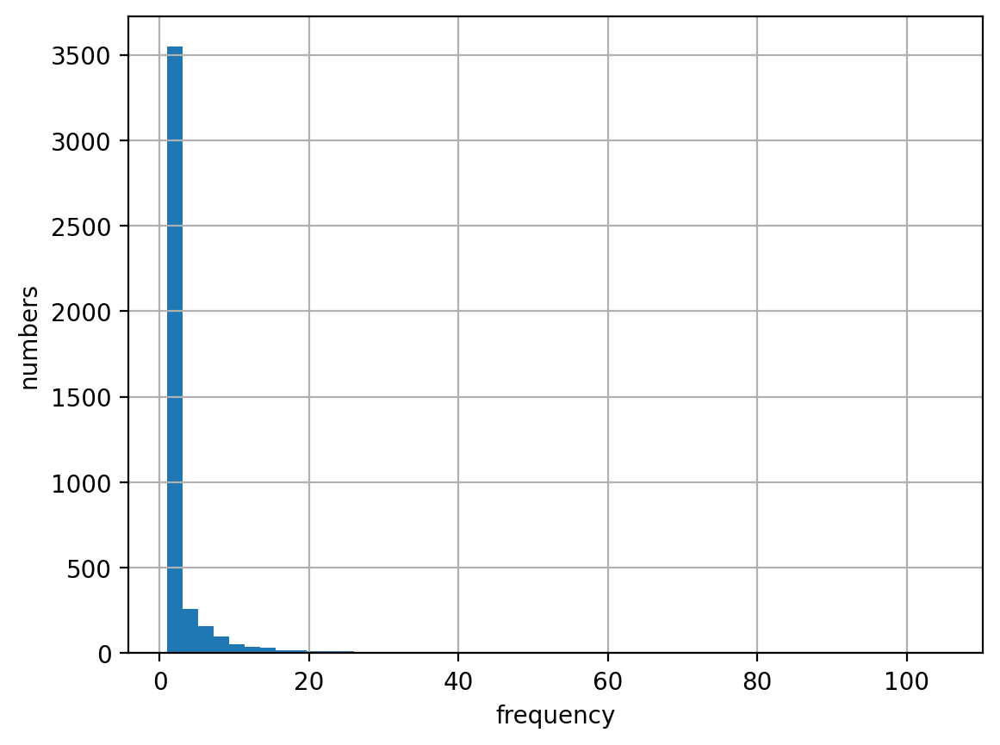

In [6]:
ax = counts.hist(bins=50, )
ax.set_xlabel("frequency")
ax.set_ylabel("numbers")

In [39]:
counts = counts.sort_values(ascending=False)

Text(0, 0.5, 'Gene')

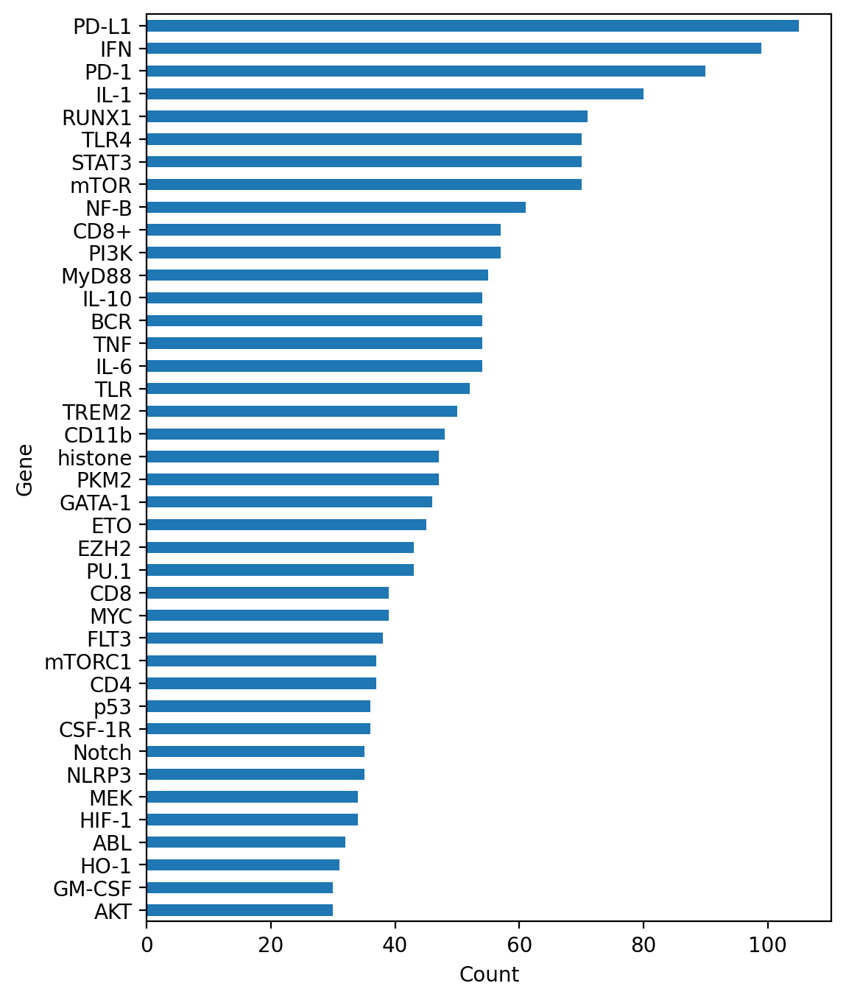

In [44]:
fig, ax = plt.subplots(figsize=(6, 8))
# ax = counts[counts >= 30].plot.barh()
ax = counts[:40].plot.barh()
ax.invert_yaxis()
ax.set_xlabel("Count")
ax.set_ylabel("Gene")

In [70]:
counts.to_csv("../output/ReprogrammingMyeloid_counts.csv")

# Data cleaning

Some abbs to fix it. and some mentions should be remove to overwhelming.

In [6]:
# # df['mention'] = df['mention'].str.capitalize()
# df['mention'] = df['mention'].replace(['acute myeloid leukemia'],'AML')
# df['mention'] = df['mention'].replace(['MDSCs'],'MDSC')
# df['mention'] = df['mention'].replace(['tumors'],'tumor')
# df['mention'] = df['mention'].replace(['tumor cells'],'tumor')
# df['mention'] = df['mention'].replace(['cancer cell'],'cancer')
# df['mention'] = df['mention'].replace(['mice'],'mouse')

# df['mention'] = df['mention'].replace(['vascular endothelial growth factor'],'VEGF')
# df['mention'] = df['mention'].replace(['anti-vascular endothelial growth factor'],'anti-VEGF')
# df['mention'] = df['mention'].replace(['diabetic retinopathy'],'Diabetic Retinopathy')
# df['mention'] = df['mention'].replace(['ranibizumab'],'Ranibizumab')
# df['mention'] = df['mention'].replace(['bevacizumab'],'Bevacizumab')
# df['mention'] = df['mention'].replace(['neovascular age-related macular degeneration'],'nAMD')
# df['mention'] = df['mention'].replace(['neovascular AMD'],'nAMD')
# df['mention'] = df['mention'].replace(['age-related macular degeneration'],'AMD')
# df['mention'] = df['mention'].replace(['CRVO'],'central retinal vein occlusion')
# df['mention'] = df['mention'].replace(['DME'],'diabetic macular edema')

In [7]:
# df.drop(df[df['mention'] == 'Aflibercept'].index, inplace=True)
# df.drop(df[df['mention'] == 'aflibercept'].index, inplace=True)
# df.drop(df[df['mention'] == 'VEGF'].index, inplace=True)
# df.drop(df[df['mention'] == 'ascular endothelial growth factor'].index, inplace=True)
# df.drop(df[df['mention'] == 'patient'].index, inplace=True)
# df.drop(df[df['mention'] == 'patients'].index, inplace=True)
# df.drop(df[df['mention'] == 'Patients'].index, inplace=True)
# df.drop(df[df['mention'] == 'PATIENTS'].index, inplace=True)
# df.drop(df[df['mention'] == 'PARTICIPANTS'].index, inplace=True)
# df.drop(df[df['pmid'] == 20664824].index, inplace=True) # This article contains just lot of words

# Make edgelist

In [19]:
G = nx.from_pandas_edgelist(df, source='pmid', target='mention', edge_attr='prob')
len(G.nodes())

5315

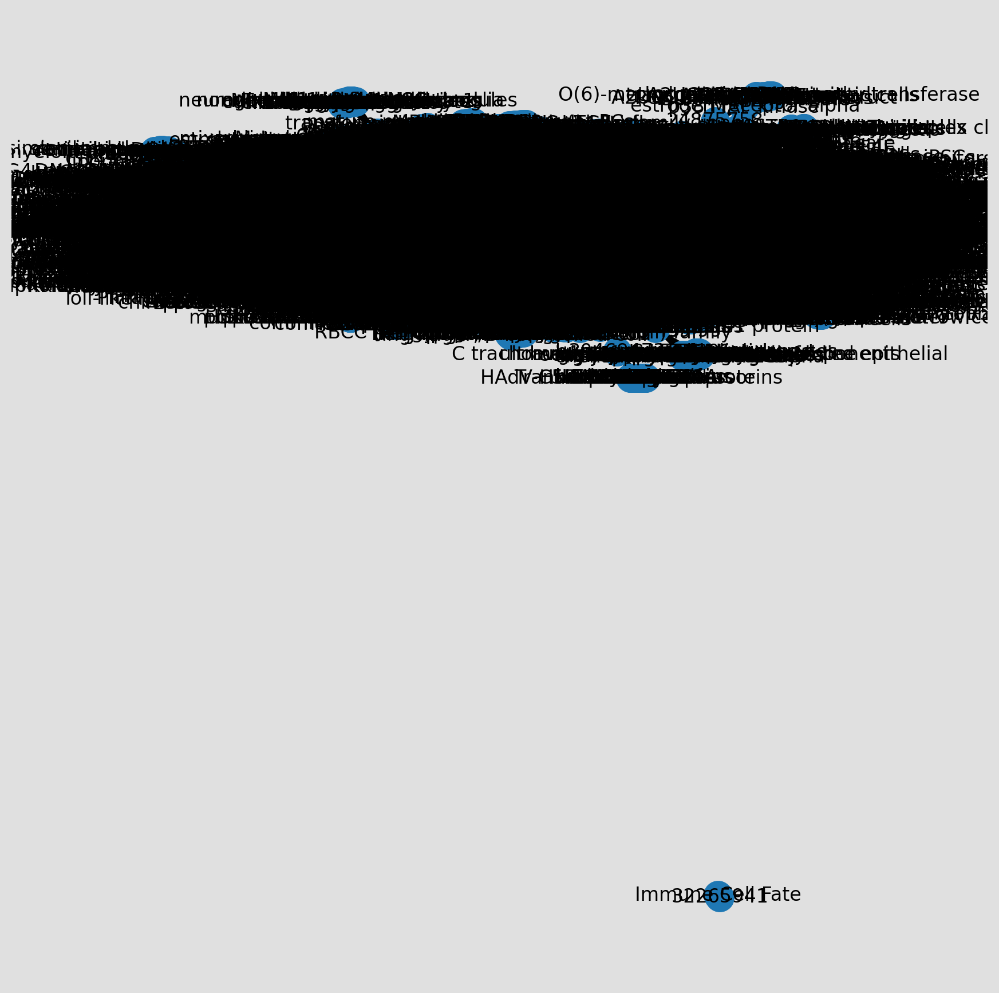

In [6]:
pos = nx.spring_layout(G) # position the nodes using the spring layout
plt.figure(figsize=(11,11),facecolor=[0.7,0.7,0.7,0.4])
nx.draw_networkx(G)
plt.axis('off')
plt.show()

In [69]:
# from matplotlib import cm
# # function to rescale list of values to range [newmin,newmax]
# def rescale(l,newmin,newmax):
#     arr = list(l)
#     return [(x-min(arr))/(max(arr)-min(arr))*(newmax-newmin)+newmin for x in arr]
# # use the matplotlib plasma colormap
# graph_colormap = cm.get_cmap('plasma', 12)
# # node color varies with Degree
# c = rescale([G.degree(v) for v in G],0.0,0.9) 
# c = [graph_colormap(i) for i in c]
# # node size varies with betweeness centrality - map to range [10,100] 
# bc = nx.betweenness_centrality(G) # betweeness centrality
# s =  rescale([v for v in bc.values()],1500,7000)
# # edge width shows 1-weight to convert cost back to strength of interaction 
# ew = rescale([float(G[u][v]['prob']) for u,v in G.edges],0.1,4)
# # edge color also shows weight
# ec = rescale([float(G[u][v]['prob']) for u,v in G.edges],0.1,1)
# ec = [graph_colormap(i) for i in ec]

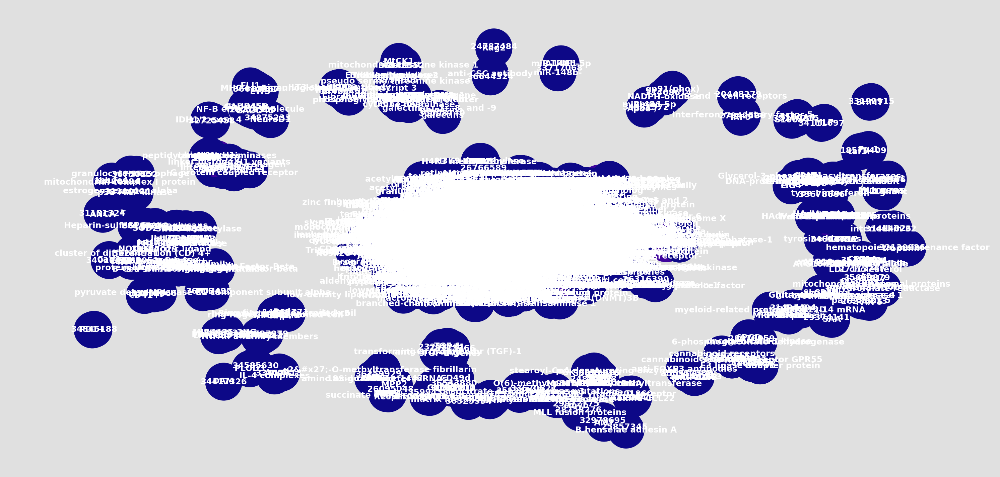

In [57]:
pos = nx.spring_layout(G)
plt.figure(figsize=(20,10),facecolor=[0.7,0.7,0.7,0.4])
nx.draw_networkx(G, pos=pos, with_labels=True, node_color=c, node_size=s,edge_color= ec,width=ew,
                 font_color='black',font_weight='bold',font_size='8')
plt.axis('off')
plt.show()

In [1]:
T = nx.minimum_spanning_tree(G)
pos = nx.spring_layout(T)
plt.figure(figsize=(19,6),facecolor=[0.7,0.7,0.7,0.1])
nx.draw_networkx(T, pos=pos, with_labels=True,node_color=c,node_size=s,edge_color= ec,width=ew,
                font_color='white',font_weight='bold',font_size='8')
plt.axis('off')
plt.show()

NameError: name 'nx' is not defined

# EDA: degree of node


In [28]:
degrees = dict(nx.degree(G))
nx.set_node_attributes(G, name='degree', values=degrees)
degree_df = pd.DataFrame(G.nodes(data='degree'), columns=['node', 'degree'])
degree_df = degree_df.sort_values(by='degree', ascending=False)
degree_df
# networkx.degree(G, weight='obj')

,node,degree
3061,31221981,77
30,IFN,50
72,PD-1,43
324,CD8+,41
318,PD-L1,37
...,...,...
2323,Pparg locus,1
2324,Kdm2a,1
2325,LysM-Cre-,1
2326,Kdm2af/f,1


In [29]:
degree_df.describe()

,degree
count,5315.000000
mean,2.687865
std,3.914382
min,1.000000
25%,1.000000
50%,1.000000
75%,2.000000
max,77.000000


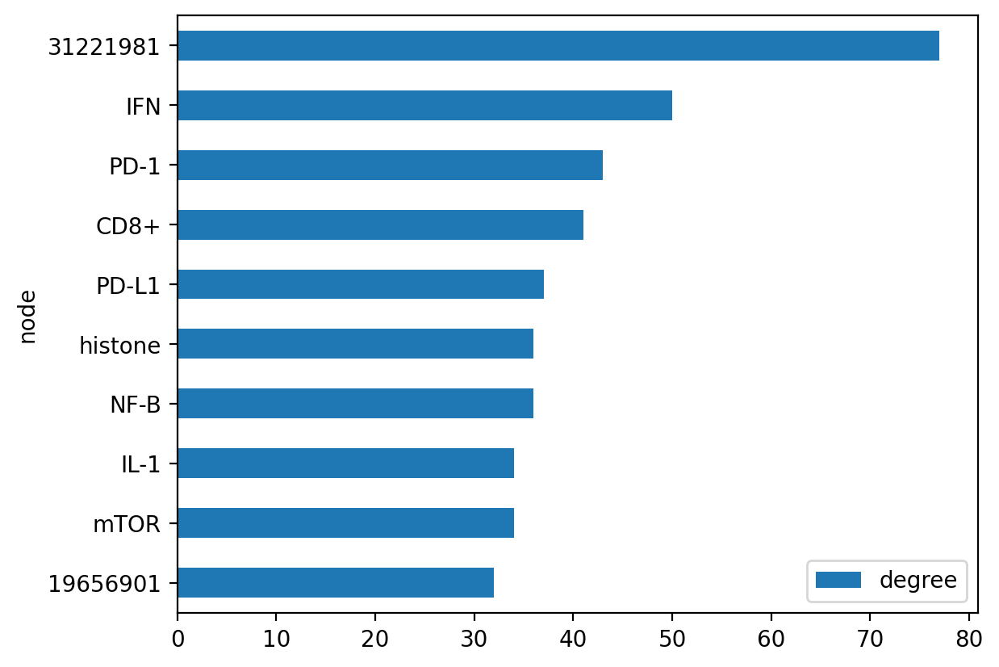

In [30]:
num_nodes_to_inspect = 10
degree_df[:num_nodes_to_inspect].plot(x='node', y='degree', kind='barh').invert_yaxis()

# EDA: centrality of node

In [20]:
betweenness_centrality = nx.betweenness_centrality(G)
nx.set_node_attributes(G, name='betweenness', values=betweenness_centrality)

betweenness_df = pd.DataFrame(G.nodes(data='betweenness'), columns=['node', 'betweenness'])
betweenness_df = betweenness_df.sort_values(by='betweenness', ascending=False)
betweenness_df.head()

,node,betweenness
30,IFN,0.070200
111,NF-B,0.061008
165,histone,0.058379
60,mTOR,0.048879
324,CD8+,0.046218


In [52]:
betweenness_df.describe()

,betweenness
count,5315.000000
mean,0.000898
std,0.003252
min,0.000000
25%,0.000000
50%,0.000000
75%,0.000348
max,0.070200


In [59]:
betweenness_df['gene'] = betweenness_df['node'].mask(pd.to_numeric(betweenness_df['node'], errors='coerce').notna())
betweenness_df.head()

,node,betweenness,gene
30,IFN,0.070200,IFN
111,NF-B,0.061008,NF-B
165,histone,0.058379,histone
60,mTOR,0.048879,mTOR
324,CD8+,0.046218,CD8+


In [62]:
betweenness_df = betweenness_df.dropna()

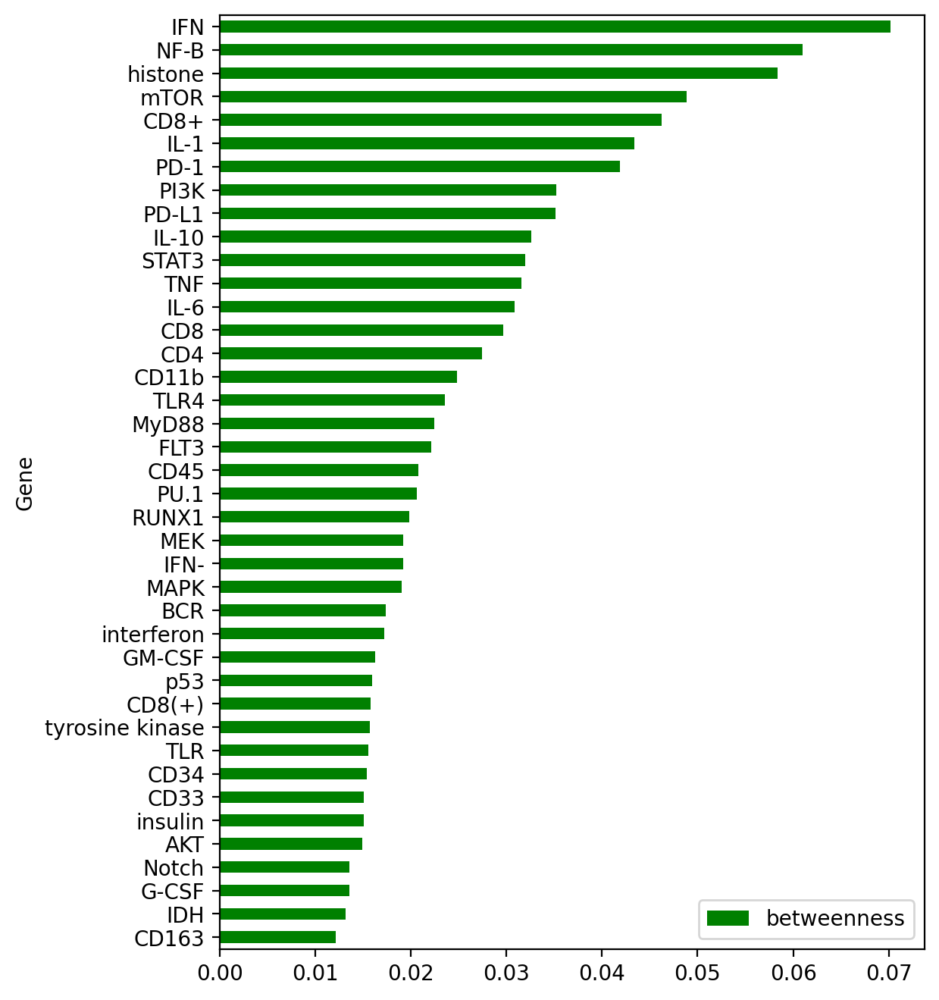

In [68]:
# fig, ax = plt.subplots()
num_nodes_to_inspect = 40
ax = betweenness_df[:num_nodes_to_inspect].plot(
    x='gene', y='betweenness', color='green', xlabel="", ylabel="Gene",
    kind='barh', figsize=(6, 8)).invert_yaxis()
# ax = betweenness_df[:num_nodes_to_inspect].plot.barh(x='betweenness', y='node', color='green')
# ax.set_xlabel("frequency")
# ax.set_ylabel("numbers")

In [71]:
betweenness_df.to_csv("../output/ReprogrammingMyeloid_centrality.csv")

# EDA: degree, centrality analysis for one code.

In [37]:
nodes_df = pd.DataFrame(dict(G.nodes(data=True))).T
nodes_df = nodes_df.sort_values(by='betweenness', ascending=False)

In [38]:
nodes_df.to_csv("../output/ReprogrammingMyeloid_centrality.csv")

# Visualization of networks

In [34]:
# largest connected component
components = nx.connected_components(G)
largest_component = max(components, key=len)
H = G.subgraph(largest_component)

# remove low-degree nodes
low_degree = [n for n, d in G.degree() if d < 5]
G.remove_nodes_from(low_degree)

# compute centrality
centrality = nx.betweenness_centrality(H, k=10, endpoints=True)

# compute community structure
lpc = nx.community.label_propagation_communities(H)
community_index = {n: i for i, com in enumerate(lpc) for n in com}

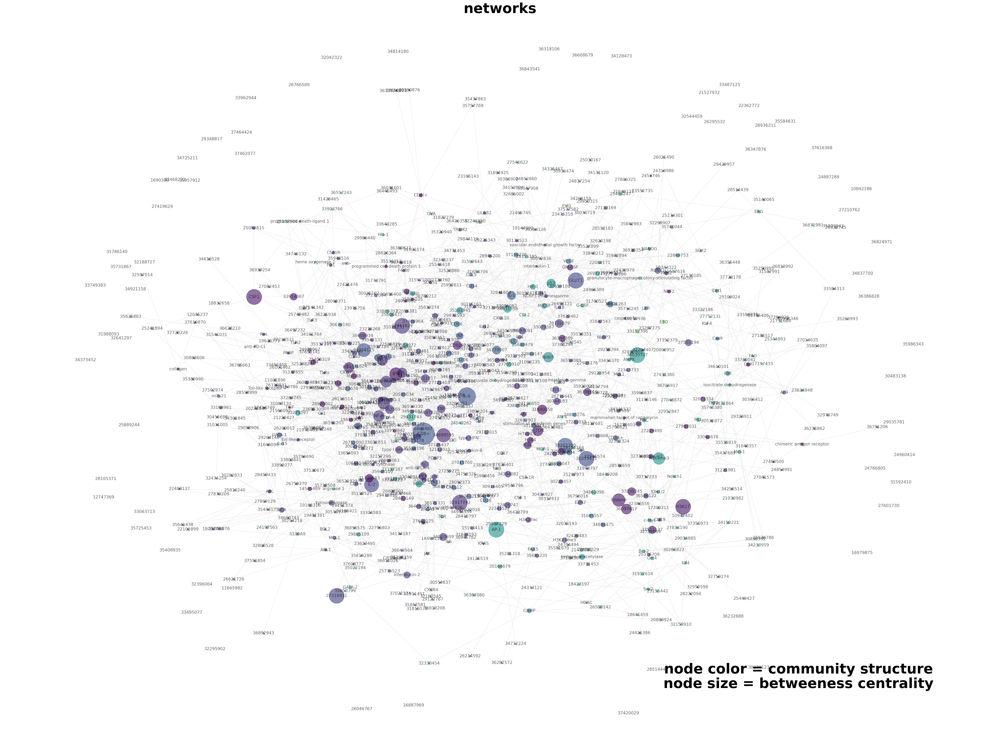

In [40]:
#### draw graph ####
fig, ax = plt.subplots(figsize=(40, 30))
pos = nx.spring_layout(H, k=0.15, seed=42)
node_color = [community_index[n] for n in H]
node_size = [v * 20000 for v in centrality.values()]
nx.draw_networkx(
    H,
    pos=pos,
    with_labels=True,
    node_color=node_color,
    node_size=node_size,
    edge_color="gainsboro",
    alpha=0.6
)

# Title/legend
font = {"color": "k", "fontweight": "bold", "fontsize": 40}
ax.set_title("networks", font)

# Change font color for legend
# font["color"] = "k"

ax.text(
    0.80,
    0.10,
    "node color = community structure",
    horizontalalignment="center",
    transform=ax.transAxes,
    fontdict=font,
)
ax.text(
    0.80,
    0.08,
    "node size = betweeness centrality",
    horizontalalignment="center",
    transform=ax.transAxes,
    fontdict=font,
)

# Resize figure for label readibility
ax.margins(0.1, 0.05)
fig.tight_layout()
plt.axis("off")
plt.show()

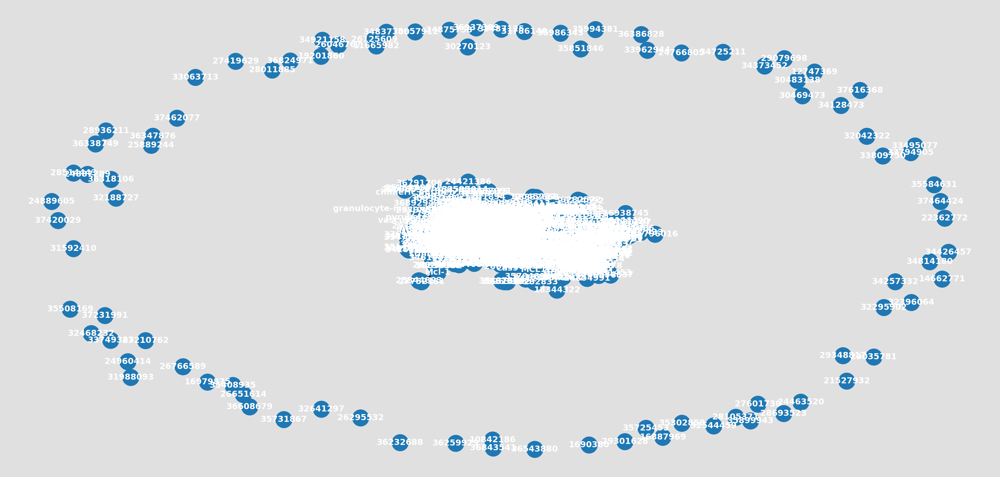

In [47]:
pos = nx.spring_layout(G)
plt.figure(figsize=(19,9),facecolor=[0.7,0.7,0.7,0.4])
nx.draw_networkx(G, pos=pos, with_labels=True,
                 font_color='white',font_weight='bold',font_size='9')
plt.axis('off')
plt.show()

In [ ]:
T = nx.minimum_spanning_tree(g)
pos = nx.spring_layout(T)
plt.figure(figsize=(19,6),facecolor=[0.7,0.7,0.7,0.1])
nx.draw_networkx(T, pos=pos, with_labels=True,node_color=c,node_size=s,edge_color= ec,width=ew,
                font_color='white',font_weight='bold',font_size='8')
plt.axis('off')
plt.show()

# Save the edgelist to file

In [17]:
# fh = open("./output/aflibercept.edgelist", "wb")
# nx.write_edgelist(G, fh)